In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader,TensorDataset
from torch.optim import Adam
from torchvision import datasets, transforms
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

# Set a set seed for PyTorch
seed = 42
torch.manual_seed(seed)

## Loading data

In [4]:
from aeon.datasets import load_classification
X, y = load_classification(name="GunPoint")

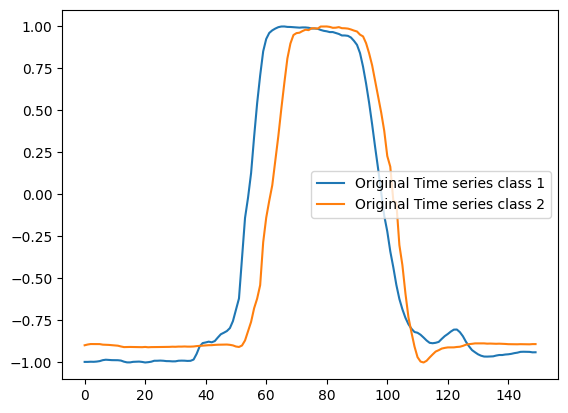

In [5]:
#Normalise
a=-1
b=1
X_normalized = []
for el in X :
  max = np.max(el)
  min = np.min(el)
  X_normalized.append((el - min) / (max - min) * (b - a) + a)

time_series_class_2 = X_normalized[0]
time_series_class_1 = X_normalized[2]


plt.plot(time_series_class_1[0], label=f'Original Time series class 1')
plt.plot(time_series_class_2[0], label=f'Original Time series class 2')
plt.legend()

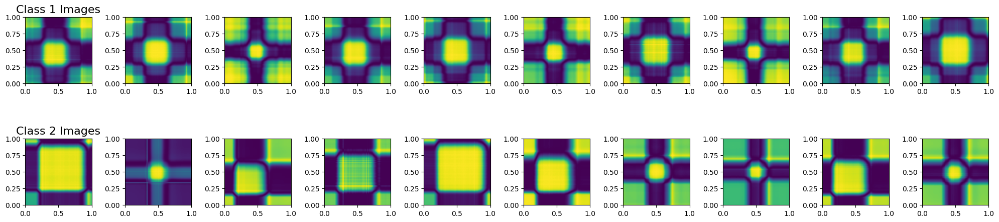

In [6]:
from pyts.image import GramianAngularField
import random
# Set parameters for Gramian Angular Field
image_size = 1.0
sample_range = (-1, 1)
method = 'summation'  # Other options: 'difference', 'product', 'double_summation'

# Create Gramian Angular Field transformer
gaf = GramianAngularField(image_size=image_size, sample_range=sample_range, method=method)

# Transform time series to GAF
gaf_images_X = []
for el in X_normalized:
  gaf_images_X.append(gaf.fit_transform(el))
gaf_images_X = np.array(gaf_images_X)

#Get index of class 1
index_1 = [index for index, value in enumerate(y) if value == '1']
index_2 = [index for index, value in enumerate(y) if value == '2']

gaf_image_class_1 = random.sample(list(gaf_images_X[index_1]),10)
gaf_image_class_2 = random.sample(list(gaf_images_X[index_2]),10)

# Create subplots for Class 1
fig, axs = plt.subplots(2, 10, figsize=(20, 5))
for i in range(10):
    axs[0, i].imshow(gaf_image_class_1[i][0], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])

# Create subplots for Class 2
for i in range(10):
    axs[1, i].imshow(gaf_image_class_2[i][0], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])

# Set titles for each row
axs[0, 0].set_title('Class 1 Images', fontsize=16)
axs[1, 0].set_title('Class 2 Images', fontsize=16)

# Adjust layout
plt.tight_layout()
plt.show()

In [7]:
gaf_images_X_normalized = (gaf_images_X + 1) / 2.0
print(np.min(gaf_images_X_normalized[0,0]))

0.0


In [7]:
#One hot encoding of labels
unique_classes = np.unique(y)
y = np.array(y).astype(int) - (np.max(unique_classes.astype(int))-1)
n_classes = len(unique_classes)
#fro training
n_samples_train = len(y)
train_y_ohe = np.zeros((n_samples_train, n_classes))
for i in range(n_samples_train):
    train_y_ohe[i, int(y[i])] = 1

In [8]:
gaf_images_X_tensor = torch.tensor(gaf_images_X, dtype=torch.float32)
y_tensor = torch.tensor(train_y_ohe, dtype=torch.float32)
train_dataset = TensorDataset(gaf_images_X_tensor, y_tensor)
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Defining VQ VAE model

#### Test encoder


In [43]:
# Random input tensor size
input_size = (1, 16, 18, 18)

# Random input tensor
random_input = torch.randn(*input_size)
# Upsample layer
upsample_layer = nn.Upsample(scale_factor=2, mode='nearest')  # Adjust scale_factor as needed
conv_layer = nn.Conv2d(16, 1, 3, padding=1)

seq_layer = nn.Sequential(
    nn.Upsample(scale_factor=4, mode='bilinear', align_corners=False),
    nn.Conv2d(16, 32, 5, stride=2, padding=2),
    nn.ReLU(),
    nn.Upsample(scale_factor=4, mode='bilinear', align_corners=False),
    nn.Conv2d(32, 64, 3, stride=2, padding=2),
    nn.ReLU(),
    nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
    nn.Conv2d(64, 128, 3, stride=2, padding=2),
    nn.ReLU(),
     nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
    nn.Conv2d(128, 64, 3, stride=2, padding=2),
    nn.ReLU(),
    nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
    nn.Conv2d(64, 16, 3, stride=2, padding=2),
    nn.ReLU(),
    nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
    nn.Conv2d(16, 1, 3, stride=1, padding=0),
    nn.Sigmoid()  # or another activation function if needed
)

# Forward pass
output = seq_layer(random_input)#conv_layer(upsample_layer(random_input))
# Print original and upsampled tensor sizes
print(f"Original Input Size: {random_input.size()}")
print(f"Upsampled Output Size: {output.size()}")

Original Input Size: torch.Size([1, 16, 18, 18])
Upsampled Output Size: torch.Size([1, 1, 150, 150])


#### Test encoder

In [17]:
# Random input tensor size
input_size = (1, 1, 150, 150)

# Random input tensor
random_input = torch.randn(*input_size)
# Upsample layer
upsample_layer = nn.Upsample(scale_factor=2, mode='nearest')  # Adjust scale_factor as needed
conv_layer = nn.Conv2d(16, 1, 3, padding=1)

seq_layer = nn.Sequential(
    # nn.Conv2d(1, 16, 4, stride=2, padding=1),
    # nn.Conv2d(16, 32, 4, stride=2, padding=1),
    # nn.Conv2d(32, 16, 4, stride=2, padding=1)
   nn.Conv2d(1, 32, 3, stride=1, padding=1),
    nn.Conv2d(32, 64, 3, stride=2, padding=1),
    nn.Conv2d(64, 128, 3, stride=1, padding=1),
    nn.Conv2d(128, 64, 3, stride=2, padding=1),
    nn.Conv2d(64, 32, 3, stride=1, padding=1),
    nn.Conv2d(32, 16, 3, stride=2, padding=0),
)

# Forward pass
output = seq_layer(random_input)#conv_layer(upsample_layer(random_input))
# Print original and upsampled tensor sizes
print(f"Original Input Size: {random_input.size()}")
print(f"Upsampled Output Size: {output.size()}")

Original Input Size: torch.Size([1, 1, 150, 150])
Upsampled Output Size: torch.Size([1, 16, 18, 18])


#### Model v1

In [9]:
class VectorQuantization(nn.Module):
    def __init__(self, num_embeddings, embedding_dim, beta):
        super(VectorQuantization, self).__init__()

        self.pre_quant_conv = nn.Conv2d(16, embedding_dim, kernel_size=1)
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.post_quant_conv = nn.Conv2d(embedding_dim, 16, kernel_size=1)

        self.beta = beta

    def forward(self, x):
        quant_input = self.pre_quant_conv(x)
        B, C, H, W = quant_input.shape
        quant_input = quant_input.permute(0, 2, 3, 1)
        quant_input = quant_input.reshape((quant_input.size(0), -1, quant_input.size(-1)))
        # Compute pairwise distances
        dist = torch.cdist(quant_input, self.embedding.weight[None, :].repeat((quant_input.size(0), 1, 1)))

        # Find index of nearest embedding
        min_encoding_indices = torch.argmin(dist, dim=-1)

        # Select the embedding weights
        quant_out = torch.index_select(self.embedding.weight, 0, min_encoding_indices.view(-1))
        quant_input = quant_input.reshape((-1, quant_input.size(-1)))


        # Compute losses
        commitment_loss = torch.mean((quant_out.detach() - quant_input)**2)
        codebook_loss = torch.mean((quant_out - quant_input.detach())**2)
        quantize_losses = codebook_loss + self.beta*commitment_loss

        # Ensure straight through gradient
        quant_out = quant_input + (quant_out - quant_input).detach()
        
        # Reshaping back to original input shape
        quant_out = quant_out.reshape((B, H, W, C)).permute(0, 3, 1, 2)
        quant_out = self.post_quant_conv(quant_out)

        return quant_out, quantize_losses

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()

        self.conv1 = nn.Conv2d(1, 16, 4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 16, 4, stride=2, padding=1)

    def forward(self, img):

        x = F.relu(self.conv1(img))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))

        return x

class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()

        # self.deconv1 = nn.ConvTranspose2d(16, 32, 4, stride=2, padding=0)
        # self.deconv2 = nn.ConvTranspose2d(32, 16, 4, stride=2, padding=1)
        # self.deconv3 = nn.ConvTranspose2d(16, 1, 4, stride=2, padding=2)

        self.deconv1 = nn.Sequential(nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(16, 32, 3, stride=1, padding=2))
        self.deconv2 = nn.Sequential(nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(32, 16, 3, stride=1, padding=1))   
        self.deconv3 = nn.Sequential(nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(16, 1, 3, stride=1, padding=0))

    def forward(self, x):

        x = F.relu(self.deconv1(x))
        x = F.relu(self.deconv2(x))
        x = F.tanh(self.deconv3(x))

        return x



def train(encoder, decoder,vector_quantization, dataloader, epochs, criterion, optimizer):
    progress_bar =  tqdm(range(epochs), desc="Epochs")

    for epoch in progress_bar:
        for i, (images, _) in enumerate(dataloader):
            optimizer.zero_grad()
            im = images.to(device)
            # Encode the images
            x = encoder(im)
            
            # Quantization
            quantized, quant_loss = vector_quantization(x)
            
            # Decode the latents
            recon_images = decoder(quantized)
            
            # Calculate loss
            recon_loss = criterion(recon_images, im)
            loss = recon_loss + quant_loss

           # Backpropagate the loss
            loss.backward()
            optimizer.step()

            progress_bar.set_description(f'Loss: {loss.item()}')

        if epoch % 300 == 0:
            gen_img = recon_images.detach().cpu().numpy()
            original_image = images.detach().cpu().numpy()
            n_img = 5
            indexes = np.random.choice(len(gen_img), size=n_img, replace=False)
            ref = [gen_img[i][0] for i in indexes]
            orig = [original_image[i][0] for i in indexes]

            # Plotting the images
            plt.figure(figsize=(15, 4))

            # Plot originals in the first row
            for i in range(n_img):
                plt.subplot(2, n_img, i + 1)
                plt.imshow(orig[i], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])
                plt.axis('off')

            # Plot generated in the second row
            for i in range(n_img):
                plt.subplot(2, n_img, i + n_img + 1)
                plt.imshow(ref[i], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])
                plt.axis('off')

            plt.show()



#### Model v2

In [13]:
class VectorQuantization(nn.Module):
    def __init__(self, num_embeddings, embedding_dim, beta):
        super(VectorQuantization, self).__init__()

        self.pre_quant_conv = nn.Conv2d(16, embedding_dim, kernel_size=1)
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.post_quant_conv = nn.Conv2d(embedding_dim, 16, kernel_size=1)

        self.beta = beta

    def forward(self, x):
        quant_input = self.pre_quant_conv(x)
        B, C, H, W = quant_input.shape
        quant_input = quant_input.permute(0, 2, 3, 1)
        quant_input = quant_input.reshape((quant_input.size(0), -1, quant_input.size(-1)))
        # Compute pairwise distances
        dist = torch.cdist(quant_input, self.embedding.weight[None, :].repeat((quant_input.size(0), 1, 1)))

        # Find index of nearest embedding
        min_encoding_indices = torch.argmin(dist, dim=-1)

        # Select the embedding weights
        quant_out = torch.index_select(self.embedding.weight, 0, min_encoding_indices.view(-1))
        quant_input = quant_input.reshape((-1, quant_input.size(-1)))


        # Compute losses
        commitment_loss = torch.mean((quant_out.detach() - quant_input)**2)
        codebook_loss = torch.mean((quant_out - quant_input.detach())**2)
        quantize_losses = codebook_loss + self.beta*commitment_loss

        # Ensure straight through gradient
        quant_out = quant_input + (quant_out - quant_input).detach()
        
        # Reshaping back to original input shape
        quant_out = quant_out.reshape((B, H, W, C)).permute(0, 3, 1, 2)
        quant_out = self.post_quant_conv(quant_out)

        return quant_out, quantize_losses

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()

        self.conv1 = nn.Conv2d(1, 32, 3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, 3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(128, 64, 3, stride=2, padding=1)
        self.conv5 = nn.Conv2d(64, 32, 3, stride=1, padding=1)
        self.conv6 = nn.Conv2d(32, 16, 3, stride=2, padding=0)

    def forward(self, img):

        x = F.relu(self.conv1(img))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = F.relu(self.conv5(x))
        x = F.relu(self.conv6(x))

        return x

class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()


        self.deconv1 = nn.Sequential(nn.Upsample(scale_factor=4, mode='bilinear', align_corners=False),
    nn.Conv2d(16, 32, 5, stride=2, padding=2))
        self.deconv2 = nn.Sequential(nn.Upsample(scale_factor=4, mode='bilinear', align_corners=False),
    nn.Conv2d(32, 64, 3, stride=2, padding=2))  
        self.deconv3 = nn.Sequential(nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
    nn.Conv2d(64, 128, 3, stride=2, padding=2))
        self.deconv4 = nn.Sequential(nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
    nn.Conv2d(128, 64, 3, stride=2, padding=2))
        self.deconv5 = nn.Sequential(nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
    nn.Conv2d(64, 16, 3, stride=2, padding=2))
        self.deconv6 = nn.Sequential(nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
    nn.Conv2d(16, 1, 3, stride=1, padding=0))

       
    
    
    nn.ReLU(),
     
    nn.ReLU(),
    
    nn.ReLU(),
    

    def forward(self, x):

        x = F.relu(self.deconv1(x))
        x = F.relu(self.deconv2(x))
        x = F.relu(self.deconv3(x))
        x = F.relu(self.deconv4(x))
        x = F.relu(self.deconv5(x))
        x = F.tanh(self.deconv6(x))

        return x



def train(encoder, decoder,vector_quantization, dataloader, epochs, criterion, optimizer):
    progress_bar =  tqdm(range(epochs), desc="Epochs")

    for epoch in progress_bar:
        for i, (images, _) in enumerate(dataloader):
            optimizer.zero_grad()
            im = images.to(device)
            # Encode the images
            x = encoder(im)
            
            # Quantization
            quantized, quant_loss = vector_quantization(x)
            
            # Decode the latents
            recon_images = decoder(quantized)
            
            # Calculate loss
            recon_loss = criterion(recon_images, im)
            loss = recon_loss + quant_loss

           # Backpropagate the loss
            loss.backward()
            optimizer.step()

            progress_bar.set_description(f'Loss: {loss.item()}')

        if epoch % 100 == 0:
            gen_img = recon_images.detach().cpu().numpy()
            original_image = images.detach().cpu().numpy()
            n_img = 5
            indexes = np.random.choice(len(gen_img), size=n_img, replace=False)
            ref = [gen_img[i][0] for i in indexes]
            orig = [original_image[i][0] for i in indexes]

            # Plotting the images
            plt.figure(figsize=(15, 4))

            # Plot originals in the first row
            for i in range(n_img):
                plt.subplot(2, n_img, i + 1)
                plt.imshow(orig[i], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])
                plt.axis('off')

            # Plot generated in the second row
            for i in range(n_img):
                plt.subplot(2, n_img, i + n_img + 1)
                plt.imshow(ref[i], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])
                plt.axis('off')

            plt.show()



## Training

In [10]:
# Define the hyperparameters

num_embeddings = 64 #4 for MNIST
embedding_dim = 4

criterion = torch.nn.MSELoss()

# Create the encoder and decoder models
encoder = Encoder().to(device)
vector_quantization = VectorQuantization(num_embeddings, embedding_dim, beta=0.01).to(device)
decoder = Decoder().to(device)

# Initialize the optimizer
optimizer = Adam(list(encoder.parameters()) + list(decoder.parameters()), lr=0.0003)

In [63]:
# Initialize the optimizer
optimizer = Adam(list(encoder.parameters()) + list(decoder.parameters()), lr=0.00001)

Loss: 0.226834237575531:   0%|          | 0/3000 [00:00<?, ?it/s]  

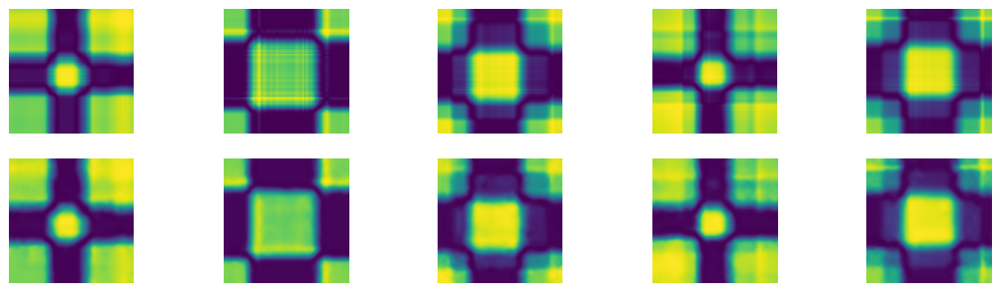

Loss: 0.22781020402908325:   3%|▎         | 100/3000 [00:54<26:29,  1.82it/s]

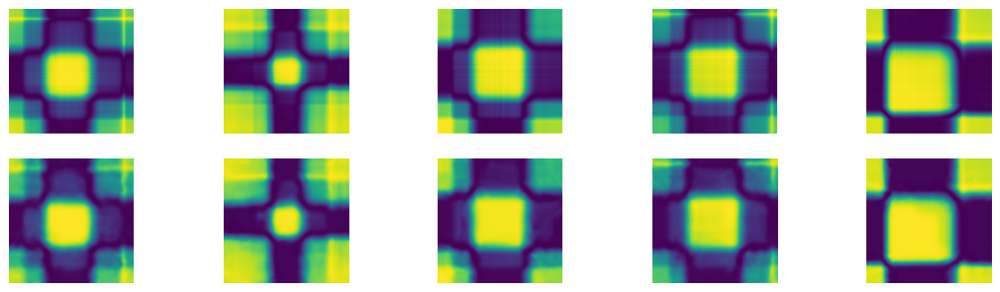

Loss: 0.25158461928367615:   7%|▋         | 200/3000 [01:48<25:03,  1.86it/s]

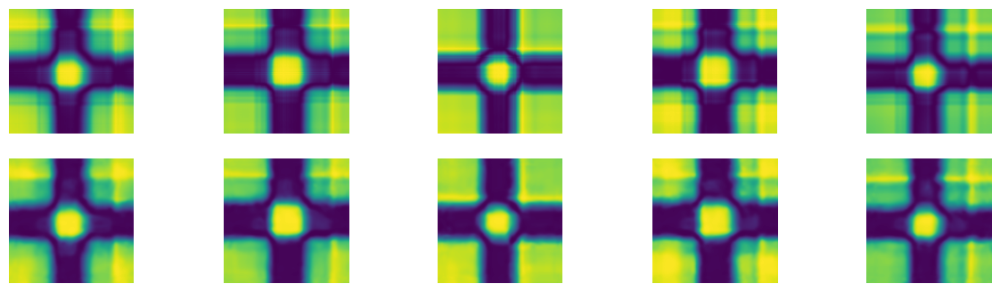

Loss: 0.2442648708820343:  10%|█         | 300/3000 [02:42<24:23,  1.85it/s] 

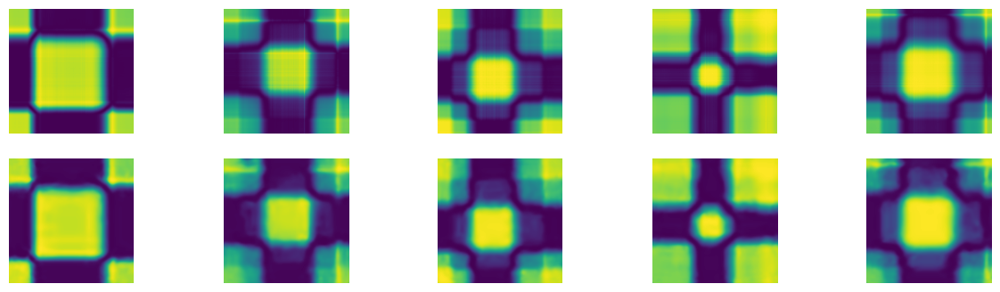

Loss: 0.2262762039899826:  13%|█▎        | 400/3000 [03:36<23:11,  1.87it/s] 

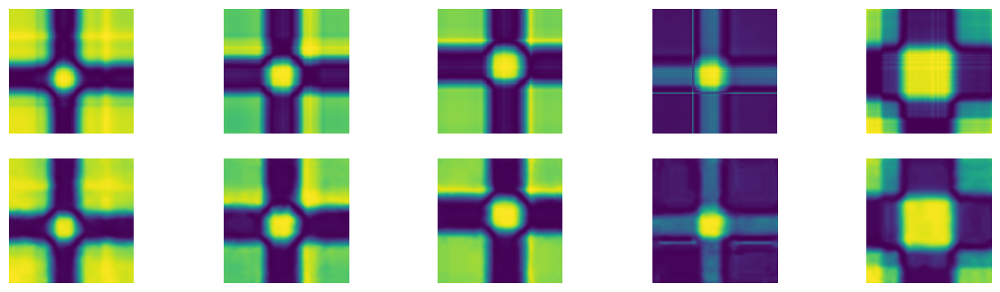

Loss: 0.24250911176204681:  17%|█▋        | 500/3000 [04:31<22:43,  1.83it/s]

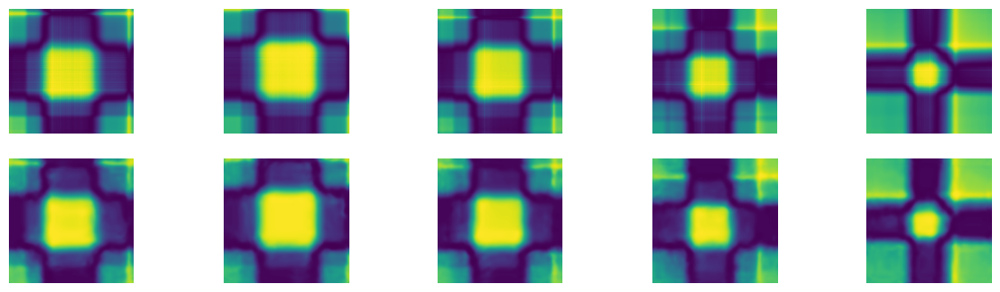

Loss: 0.20714375376701355:  20%|██        | 600/3000 [05:25<21:34,  1.85it/s]

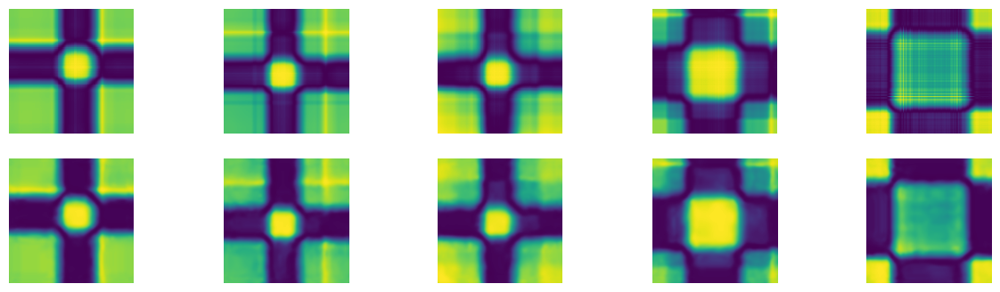

Loss: 0.21410873532295227:  23%|██▎       | 700/3000 [06:19<20:40,  1.85it/s]

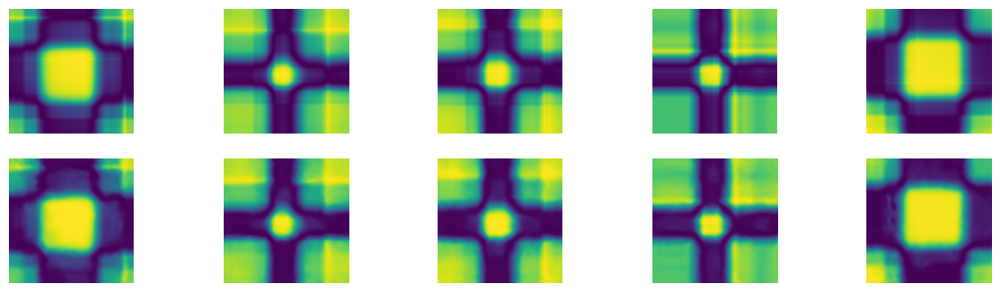

Loss: 0.22750349342823029:  27%|██▋       | 800/3000 [07:13<19:47,  1.85it/s]

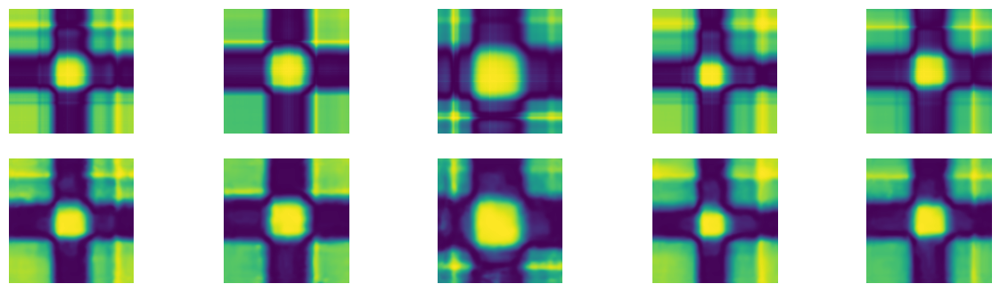

Loss: 0.20651762187480927:  30%|███       | 900/3000 [08:07<19:08,  1.83it/s]

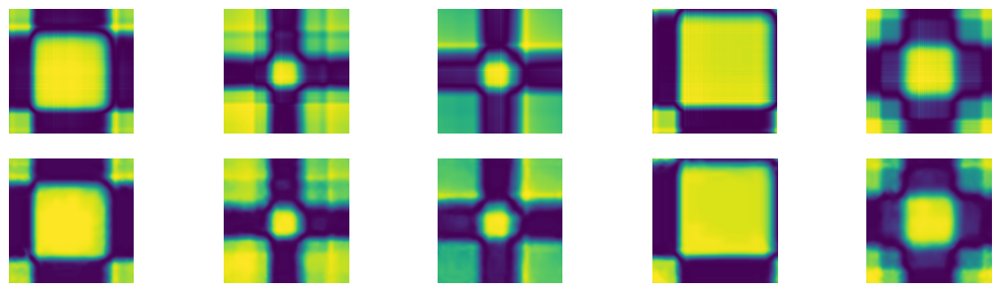

Loss: 0.22835958003997803:  33%|███▎      | 1000/3000 [09:01<17:12,  1.94it/s]

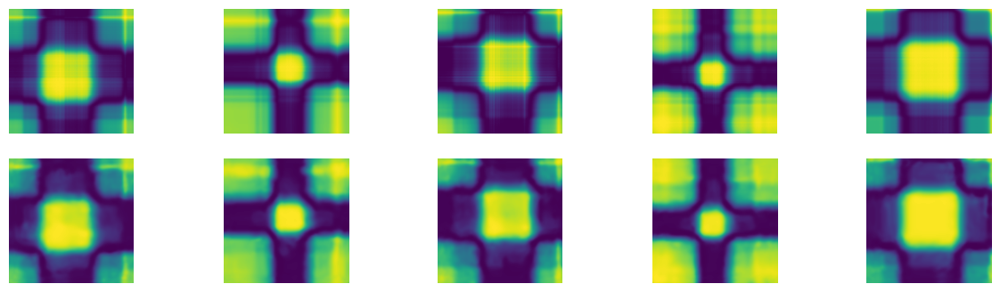

Loss: 0.20190933346748352:  37%|███▋      | 1100/3000 [09:52<15:54,  1.99it/s]

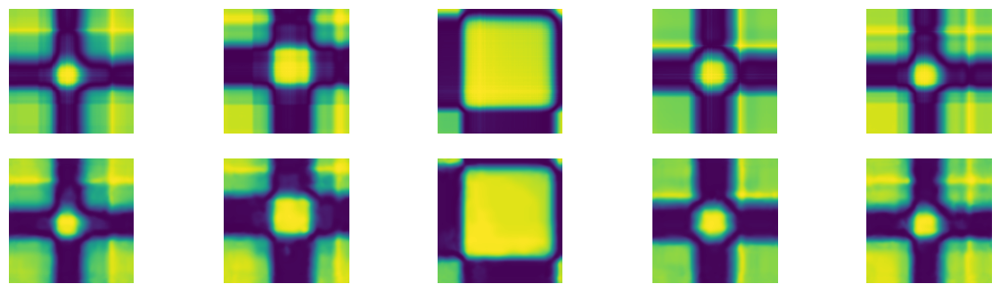

Loss: 0.2223687767982483:  40%|████      | 1200/3000 [10:42<15:03,  1.99it/s] 

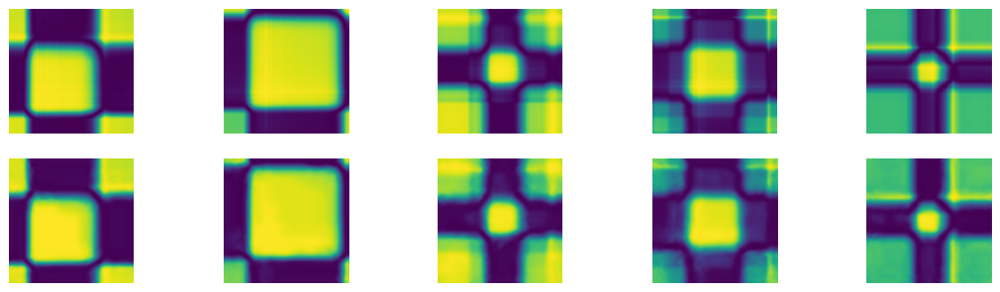

Loss: 0.23095306754112244:  43%|████▎     | 1300/3000 [11:32<13:52,  2.04it/s]

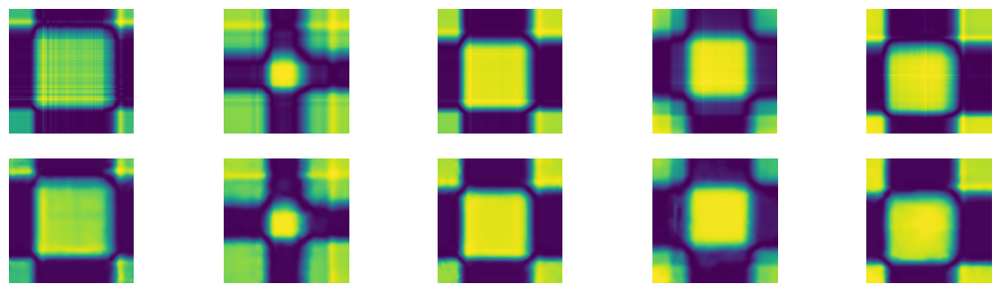

Loss: 0.2245989441871643:  47%|████▋     | 1400/3000 [12:24<13:50,  1.93it/s] 

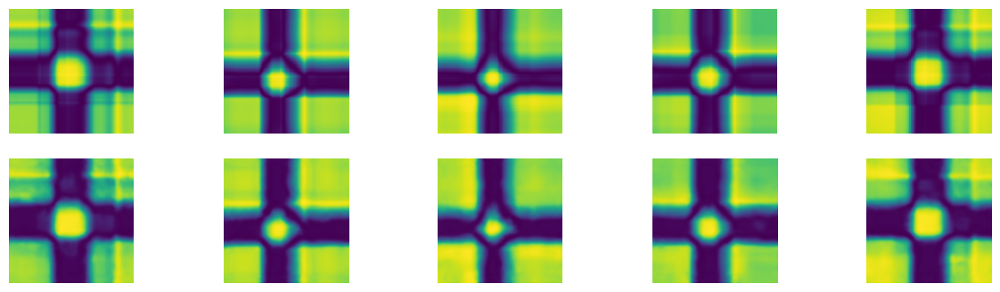

Loss: 0.26674768328666687:  50%|█████     | 1500/3000 [13:16<12:53,  1.94it/s]

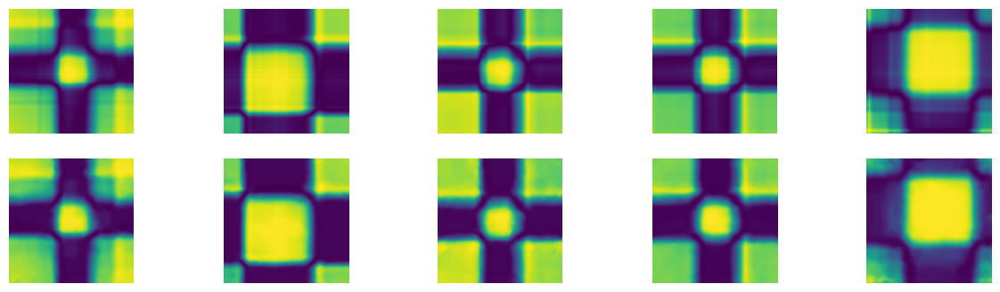

Loss: 0.19968706369400024:  53%|█████▎    | 1600/3000 [14:08<11:58,  1.95it/s]

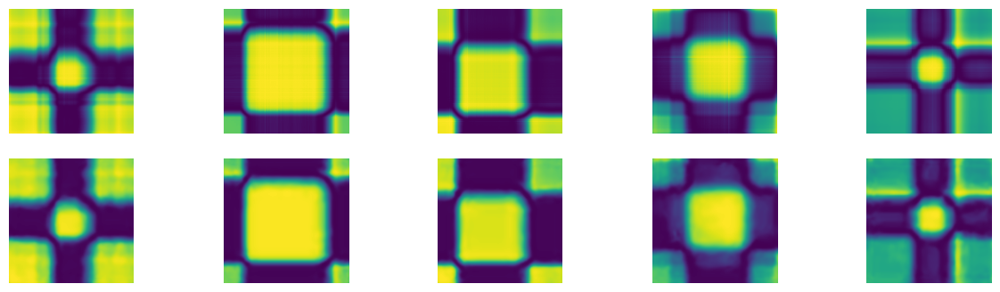

Loss: 0.27342212200164795:  57%|█████▋    | 1700/3000 [15:00<11:16,  1.92it/s]

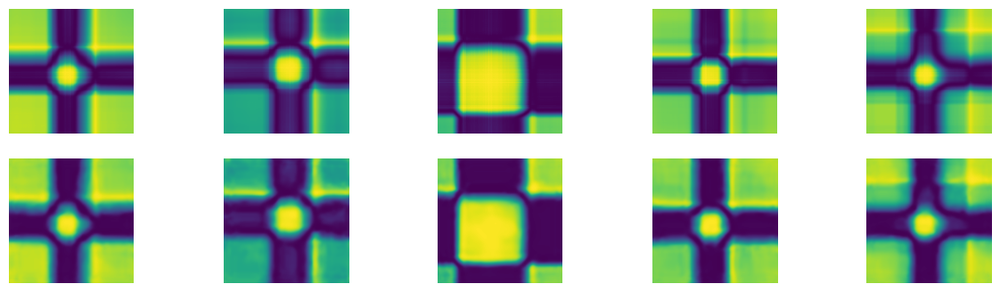

Loss: 0.22301335632801056:  60%|██████    | 1800/3000 [15:51<10:20,  1.93it/s]

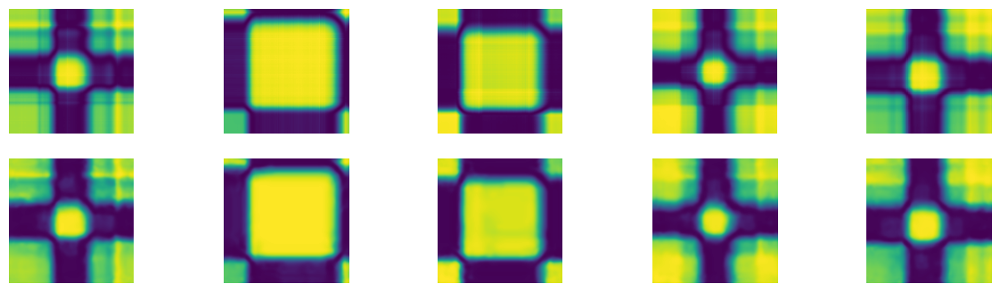

Loss: 0.2277175486087799:  63%|██████▎   | 1900/3000 [16:44<09:47,  1.87it/s] 

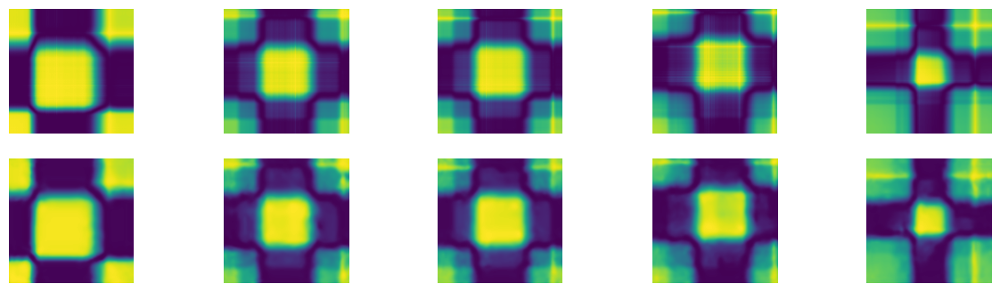

Loss: 0.24055127799510956:  67%|██████▋   | 2000/3000 [17:36<08:15,  2.02it/s]

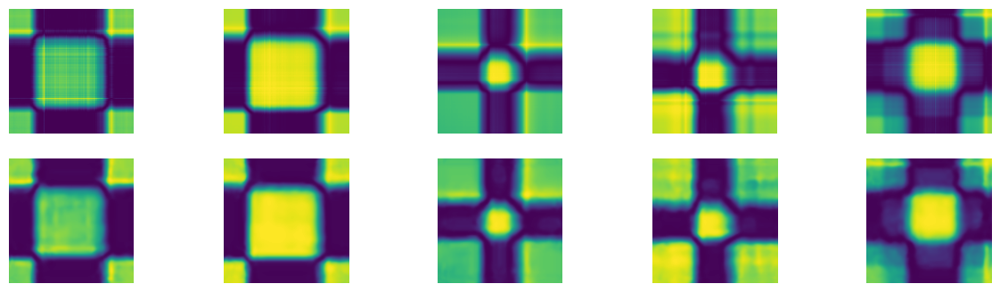

Loss: 0.21632708609104156:  70%|███████   | 2100/3000 [18:27<07:34,  1.98it/s]

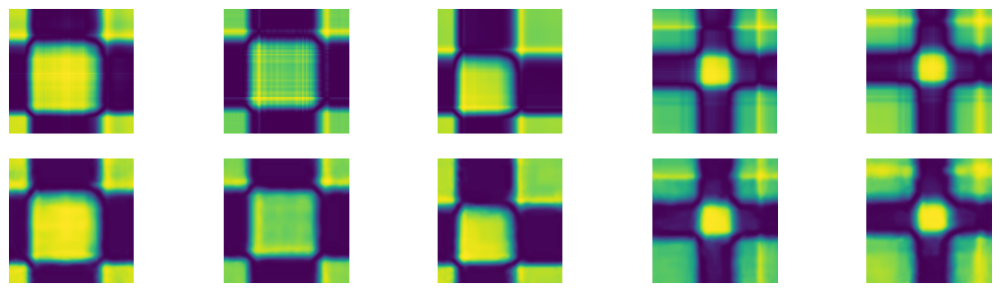

Loss: 0.2300315499305725:  73%|███████▎  | 2200/3000 [19:16<06:31,  2.04it/s] 

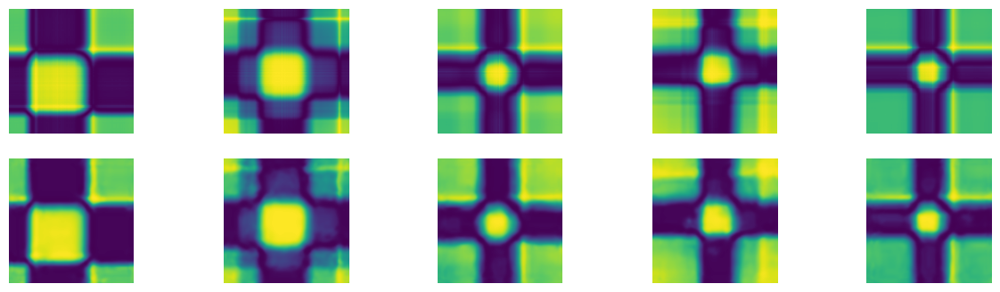

Loss: 0.23744305968284607:  77%|███████▋  | 2300/3000 [20:06<05:47,  2.01it/s]

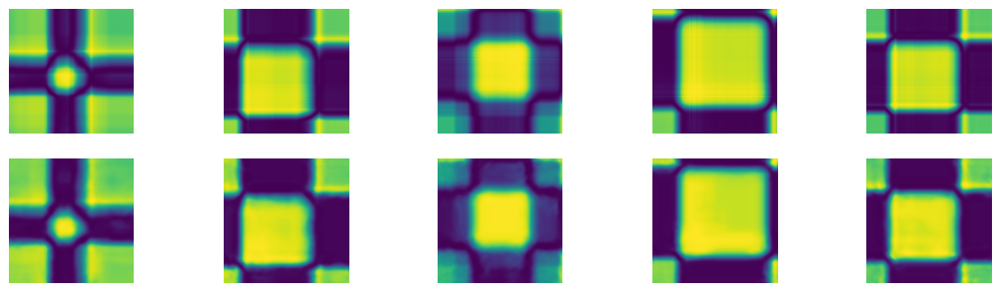

Loss: 0.22021277248859406:  80%|████████  | 2400/3000 [20:55<04:53,  2.04it/s]

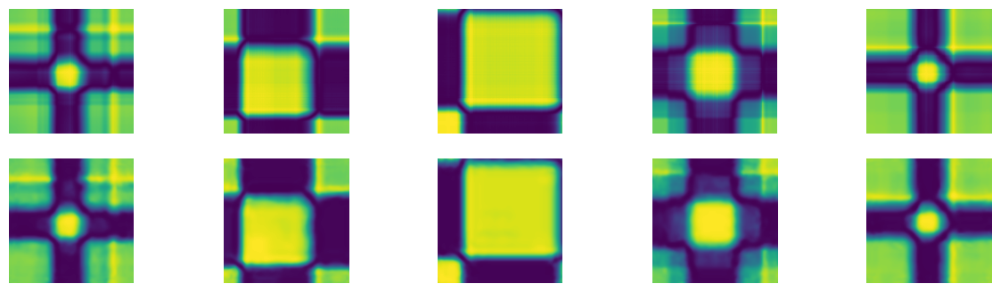

Loss: 0.23074576258659363:  83%|████████▎ | 2500/3000 [21:46<04:08,  2.01it/s]

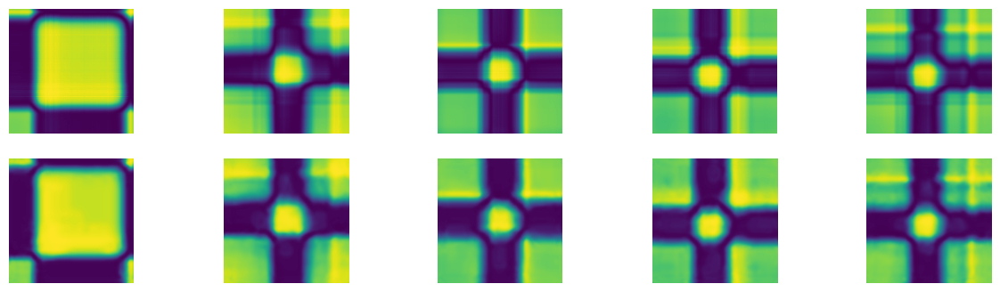

Loss: 0.2263900190591812:  87%|████████▋ | 2600/3000 [22:36<03:16,  2.04it/s] 

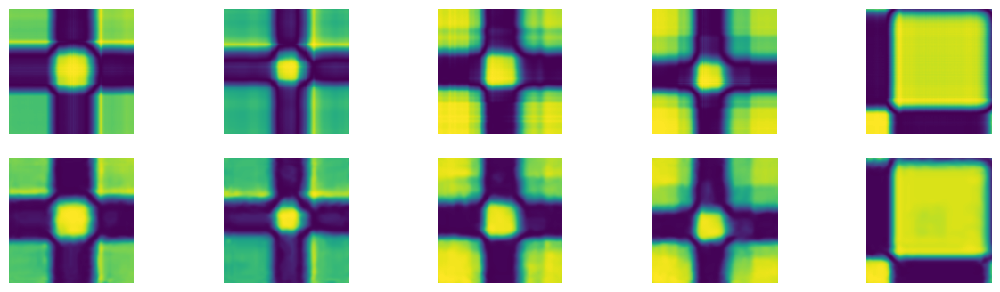

Loss: 0.2171548455953598:  90%|█████████ | 2700/3000 [23:29<02:40,  1.87it/s] 

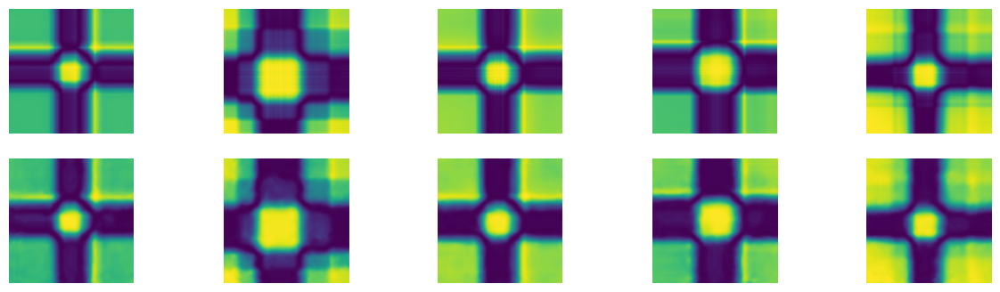

Loss: 0.22616703808307648:  93%|█████████▎| 2800/3000 [24:22<01:47,  1.86it/s]

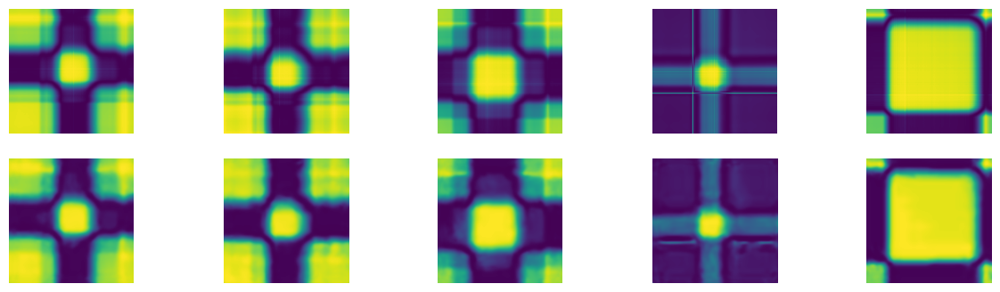

Loss: 0.2278972715139389:  97%|█████████▋| 2900/3000 [25:15<00:54,  1.85it/s] 

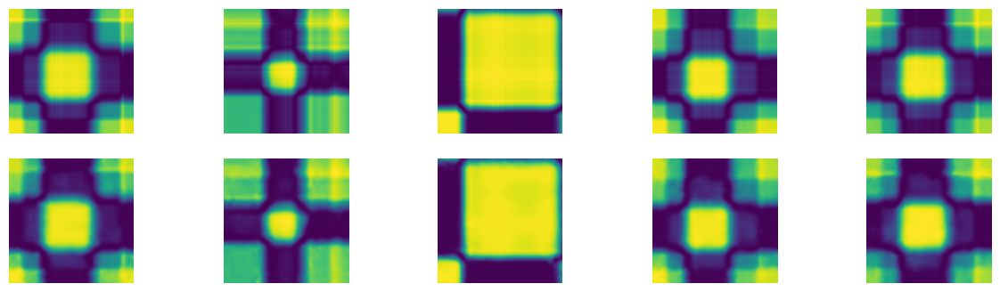

Loss: 0.19924920797348022: 100%|██████████| 3000/3000 [26:07<00:00,  1.91it/s]


In [64]:
# Train the VQ VAE
encoder.train()
vector_quantization.train()
decoder.train()
train(encoder, decoder,vector_quantization, dataloader=train_loader, epochs=3000, criterion=criterion,optimizer=optimizer)

## Codebook analysis


In [49]:
# Retrieve the codebook
codebook = vector_quantization.embedding.weight.detach().cpu().numpy()

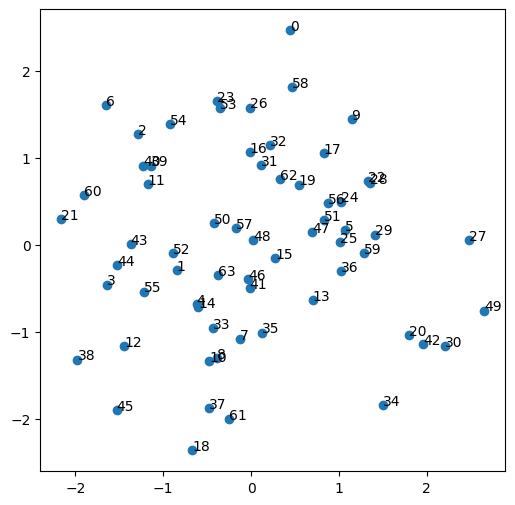

In [66]:
from sklearn.decomposition import PCA
# Apply PCA
pca = PCA(n_components=2, )
codebook_2d = pca.fit_transform(codebook)

# Plot the embeddings
plt.figure(figsize=(6, 6))
plt.scatter(codebook_2d[:, 0], codebook_2d[:, 1])
for i, txt in enumerate(range(codebook.shape[0])):
    plt.annotate(txt, (codebook_2d[i, 0], codebook_2d[i, 1]))
plt.show()

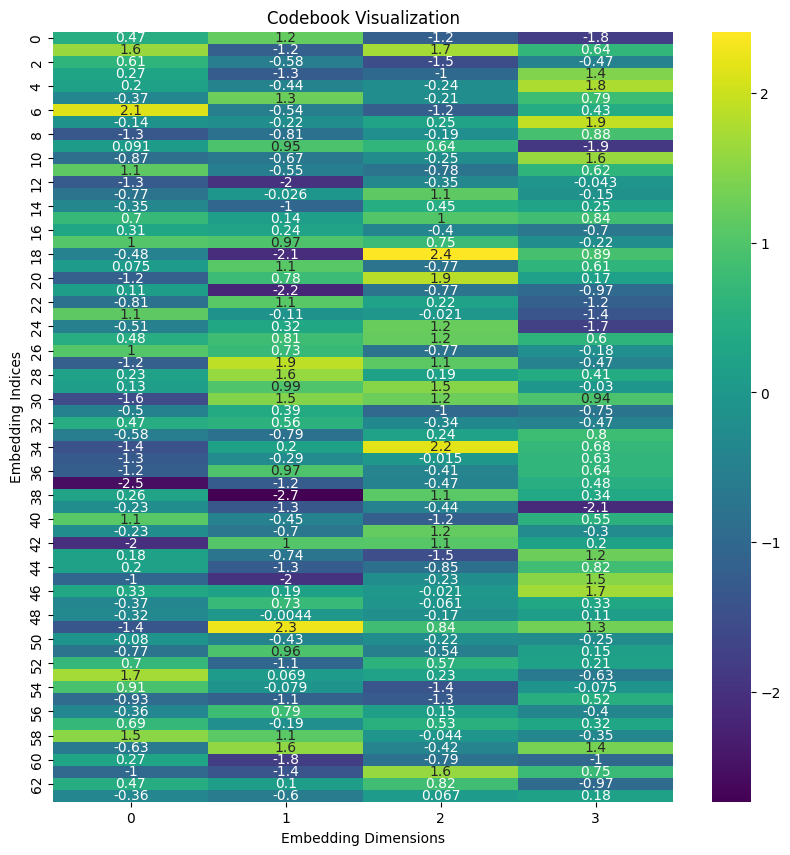

In [67]:
import seaborn as sns

# Create a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(codebook, annot=True, cmap='viridis')
plt.title('Codebook Visualization')
plt.xlabel('Embedding Dimensions')
plt.ylabel('Embedding Indices')
plt.show()

## Generation tests with VQ-VAE

In [15]:
# Load models
loaded_decoder = torch.load('VQVAE_models\decoder_UPSAMPLE_3k.pth')
decoder = Decoder().to(device)
decoder.load_state_dict(loaded_decoder)
decoder.eval()

loaded_encoder = torch.load('VQVAE_models\encoder_UPSAMPLE_3k.pth')
encoder = Encoder().to(device)
encoder.load_state_dict(loaded_encoder)
encoder.eval()

loaded_vector_quantization = torch.load('VQVAE_models/vector_quantization_3k.pth')
vector_quantization = VectorQuantization(num_embeddings, embedding_dim, beta=0.01).to(device)
vector_quantization.load_state_dict(loaded_vector_quantization)
vector_quantization.eval()

VectorQuantization(
  (pre_quant_conv): Conv2d(16, 4, kernel_size=(1, 1), stride=(1, 1))
  (embedding): Embedding(64, 4)
  (post_quant_conv): Conv2d(4, 16, kernel_size=(1, 1), stride=(1, 1))
)

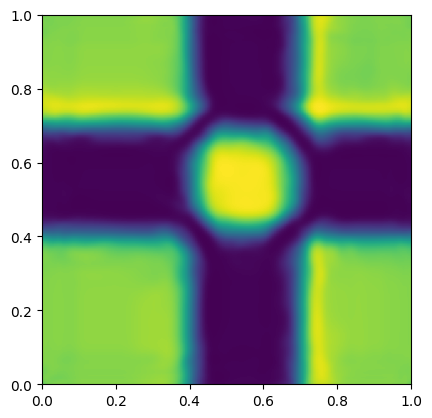

In [16]:
# Generation using random tensor
random_tensor = encoder(gaf_images_X_tensor[0].to(device)).unsqueeze(0) #torch.randn(1, 16, 18, 18).to(device) #
test,_ = vector_quantization(random_tensor)


out = decoder(test)
out = out.detach().cpu().numpy()
plt.imshow(out[0][0], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])


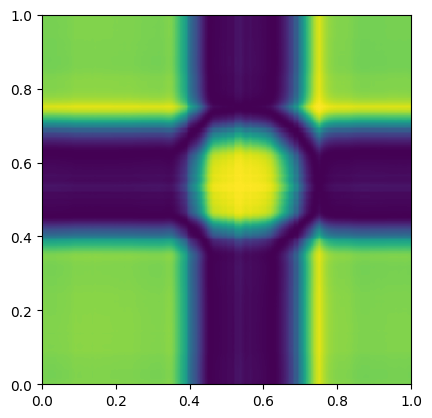

In [52]:
plt.imshow(gaf_images_X_tensor[0][0], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])

torch.Size([1, 4, 18, 18])


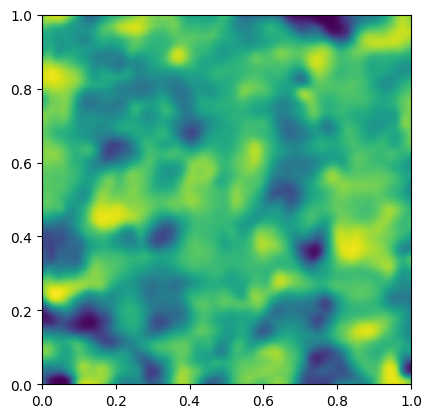

In [18]:
# Generation using random indexes and getting embeddings from the codebook

random_indexes = np.random.randint(0, 64, size=324)
codebook = vector_quantization.embedding.weight.detach().cpu()
random_quant = codebook[random_indexes].to(device)

last_layer = vector_quantization.post_quant_conv
random_quant=random_quant.reshape((1, 18, 18, 4)).permute(0, 3, 1, 2)
print(random_quant.shape)
test= last_layer(random_quant)

out = decoder(test)
out = out.detach().cpu().numpy()
plt.imshow(out[0][0], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])

## Reconstruction


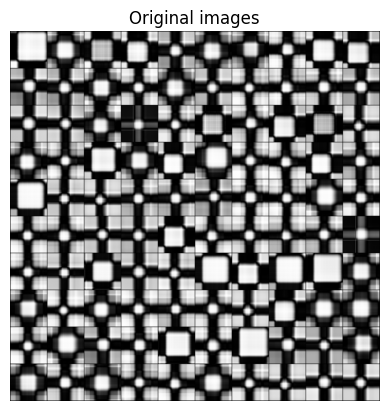

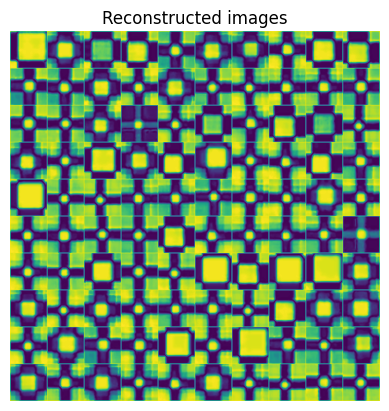

In [74]:
 # Reconstruction part
idxs = torch.randint(0, len(train_dataset), (100, ))
ims = torch.cat([train_dataset[idx][0][None, :] for idx in idxs]).float()
ims = ims.to(device)
encoder.eval()
vector_quantization.eval()
decoder.eval()

generated_im= decoder(vector_quantization(encoder(ims))[0])
ims = (ims+1)/2
generated_im = 1 - (generated_im+1)/2


output_orig = ims.view(ims.size(0), -1, ims.size(2), ims.size(3))
grid_orig = torchvision.utils.make_grid(output_orig.detach().cpu(), nrow=10)
img_orig = transforms.ToPILImage()(grid_orig)


output = generated_im.view(generated_im.size(0), -1, generated_im.size(2), generated_im.size(3))
grid = torchvision.utils.make_grid(output.detach().cpu(), nrow=10)
img = transforms.ToPILImage()(grid)

img_gray = img.convert('L')
img_array = np.array(img_gray)
negative_img_array = 255 - img_array


# Display the image using Matplotlib
plt.imshow(img_orig,cmap='viridis', origin='lower', extent=[0, 1, 0, 1])
plt.title('Original images')
plt.axis('off')
plt.show()

plt.imshow(negative_img_array,cmap='viridis', origin='lower', extent=[0, 1, 0, 1])
plt.title('Reconstructed images')
plt.axis('off')
plt.show()

## Save decoder and codebook

In [68]:
torch.save(decoder.state_dict(), 'decoder_UPSAMPLE_vf.pth')
torch.save(vector_quantization.state_dict(), 'vector_quantization_vf.pth')
torch.save(encoder.state_dict(), 'encoder_UPSAMPLE_vf.pth')

# Defining CGAN model

Using the MLP one to generate the sequences of the codebook

#### test


In [130]:
# Random input tensor size
input_size = (1,1,9, 9)

# Random input tensor
random_input = torch.randn(*input_size)
# Upsample layer
upsample_layer = nn.Upsample(scale_factor=2, mode='nearest')  # Adjust scale_factor as needed
conv_layer = nn.Conv2d(1, 1, 3, 1, 1, bias=False)

# Forward pass
output = conv_layer(upsample_layer(random_input))
# Print original and upsampled tensor sizes
print(f"Original Input Size: {random_input.size()}")
print(f"Upsampled Output Size: {output.size()}")

Original Input Size: torch.Size([1, 1, 9, 9])
Upsampled Output Size: torch.Size([1, 1, 18, 18])


### Model : Upsample GAN - 150*150 ouput

In [80]:
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc, num_classes, embed_size, VQmodel, decoder_model):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.Upsample(scale_factor=5),
            nn.Conv2d(nz+embed_size*num_classes, ngf * 8, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 5 x 5``
            nn.Upsample(scale_factor=2),  # Upsample instead of ConvTranspose2d
            nn.Conv2d(ngf * 8, ngf * 4, 4, 1, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 9 x 9``
            nn.Upsample(scale_factor=2),  # Upsample instead of ConvTranspose2d
            nn.Conv2d(ngf * 4, nc, 3, 1, 1, bias=False),
            # state size. ``(nc) x 18 x 18``
        )

        self.embed = nn.Embedding(num_classes, embed_size)

        self.vector_quantization = VQmodel

        self.decoder = decoder_model

        for param in self.vector_quantization.parameters():
            param.requires_grad = False
        for param in self.decoder.parameters():
            param.requires_grad = False

    def forward(self, input, labels):
        embedding = self.embed(labels)
        embedding = embedding.view(len(embedding), -1).unsqueeze(2).unsqueeze(3)
        input = input.unsqueeze(2).unsqueeze(3)
        x = torch.cat([input, embedding], dim=1)
        out = self.main(x)
        
        out,_ = self.vector_quantization(out)
        out = self.decoder(out)
        return  out

class Discriminator(nn.Module):
    def __init__(self, nc, ndf, num_classes, img_size):
        super(Discriminator, self).__init__()
        self.img_size = img_size
        self.num_classes = num_classes
        self.main = nn.Sequential(
            # input is ``(nc) x 150 x 150``
            nn.Conv2d(nc+num_classes, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 75 x 75``
            nn.Conv2d(ndf, ndf * 2, 3, 2, 2, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 38 x 38``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 19 x 19``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 9 x 9``
            nn.Conv2d(ndf * 8, 1, 4, 2, 0, bias=False),
            # state size. ``1 x 3 x 3``
            nn.Conv2d(1, 1, 3, 1, 0, bias=False),
            nn.Sigmoid()
        )

        self.embed = nn.Embedding(num_classes, img_size*img_size)

    def forward(self, input, labels):
        embedding = self.embed(labels).view(labels.shape[0],self.num_classes,self.img_size,self.img_size)
        x = torch.cat([input, embedding], dim=1)
        return self.main(x)


#### Hyperparameters

In [81]:
# Set hyperparameters
img_size = gaf_images_X_tensor[0,0].shape[0]
num_classes = n_classes
lr= 0.001
b1 = 0.5
b2 = 0.999
epochs = 1000

# Number of channels in the training images.
nc = 16

# Size of z latent vector (i.e. size of generator input)
latent_dim = 50
embed_size = 10
# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 60

In [82]:
# Loss functions
adversarial_loss = torch.nn.MSELoss()
# Initialize generator and discriminator
generator = Generator(nz=latent_dim, ngf=ngf,nc=nc, num_classes=num_classes, embed_size=embed_size, VQmodel=vector_quantization, decoder_model=decoder)
discriminator = Discriminator(nc=1, ndf=ndf, num_classes=num_classes, img_size=img_size)

generator.to(device)
discriminator.to(device)
adversarial_loss.to(device)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1,b2))


In [83]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
num_parameters_gen= count_parameters(generator)
num_parameters_disc=count_parameters(discriminator)

print(f"Number of parameters in the genrator: {num_parameters_gen}")
print(f"Number of parameters in the discriminator: {num_parameters_disc}")

Number of parameters in the genrator: 2458132
Number of parameters in the discriminator: 2426049


### MLP GAN

In [19]:
class Generator(nn.Module):
    def __init__(self, latent_dim, out_shape, num_classes,VQmodel, decoder_model):
        super(Generator, self).__init__()

        self.label_emb = nn.Embedding(num_classes, num_classes)

        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(latent_dim + num_classes**2, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            *block(1024, 2048),
            nn.Linear(2048, out_shape),
            
        )

        
        self.vector_quantization = VQmodel

        self.decoder = decoder_model

        for param in self.vector_quantization.parameters():
            param.requires_grad = False
        for param in self.decoder.parameters():
            param.requires_grad = False


    def forward(self, noise, labels):
        # Concatenate label embedding and image to produce input
        emb = self.label_emb(labels)
        emb = emb.view(len(emb),-1)
        gen_input = torch.cat((emb, noise), -1)
        img = self.model(gen_input)

        img = img.view(-1,16,18,18)
        img,_ = self.vector_quantization(img)
        img = self.decoder(img)

        return img


class Discriminator(nn.Module):
    def __init__(self,in_shape,num_classes):
        super(Discriminator, self).__init__()

        self.label_embedding = nn.Embedding(num_classes, num_classes)

        self.model = nn.Sequential(
            nn.Linear(num_classes**2 +in_shape, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, img, labels):
        emb = self.label_embedding(labels)
        emb = emb.view(len(emb),-1)
        # Concatenate label embedding and image to produce input
        d_in = torch.cat((img.view(img.size(0), -1),emb), -1)
        validity = self.model(d_in)
        return validity

In [32]:
# Set hyperparameters
latent_dim = 150
img_shape = 18*18*16
num_classes = n_classes
lr = 0.0001
b1 = 0.5
b2 = 0.999
epochs = 2000
img_size = 150

In [46]:
# Loss functions
adversarial_loss = torch.nn.MSELoss()
# Initialize generator and discriminator
generator = Generator(latent_dim, img_shape,num_classes, vector_quantization, decoder)
discriminator = Discriminator(150*150,num_classes)

generator.to(device)
discriminator.to(device)
adversarial_loss.to(device)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1,b2))

In [96]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
num_parameters_gen= count_parameters(generator)
num_parameters_disc=count_parameters(discriminator)

print(f"Number of parameters in the genrator: {num_parameters_gen}")
print(f"Number of parameters in the discriminator: {num_parameters_disc}")

Number of parameters in the genrator: 9671108
Number of parameters in the discriminator: 9769605


## Training GAN

D_Loss: 0.0527796633541584,G_Loss: 0.4600274860858917 :   0%|          | 0/2000 [00:00<?, ?it/s]  

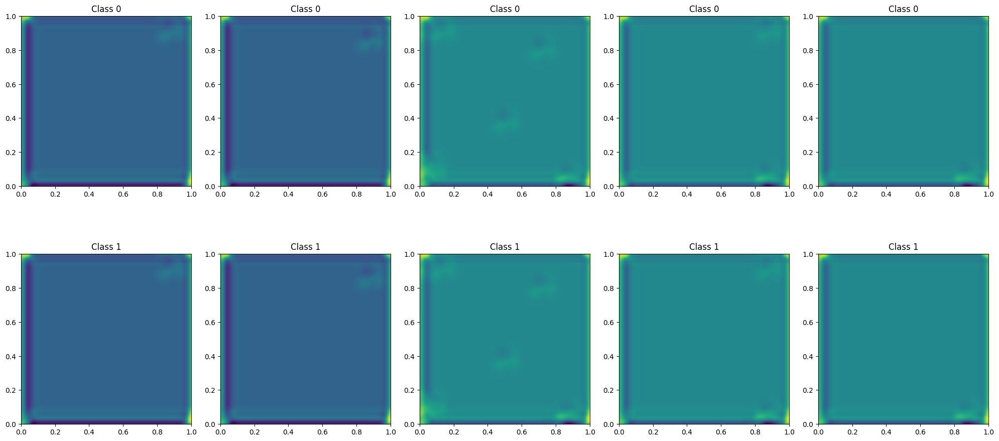

D_Loss: 0.011199267581105232,G_Loss: 0.9172189831733704 :   2%|▎         | 50/2000 [00:19<11:37,  2.80it/s] 

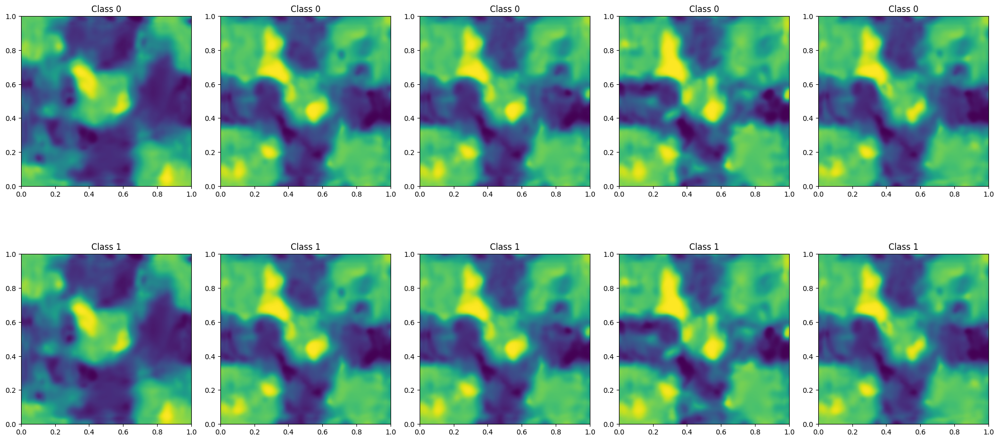

D_Loss: 0.0489765964448452,G_Loss: 0.8238247036933899 :   5%|▌         | 100/2000 [00:39<11:21,  2.79it/s]   

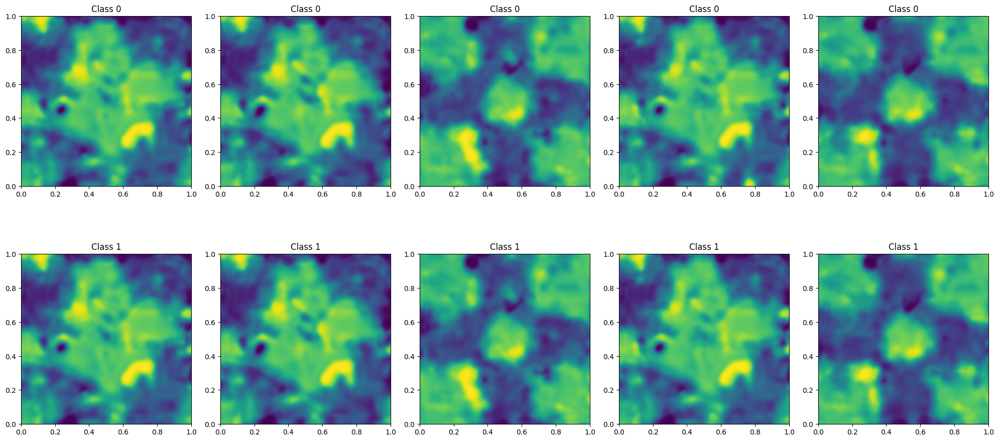

D_Loss: 0.07631154358386993,G_Loss: 0.9999953508377075 :   8%|▊         | 150/2000 [00:58<11:09,  2.76it/s]  

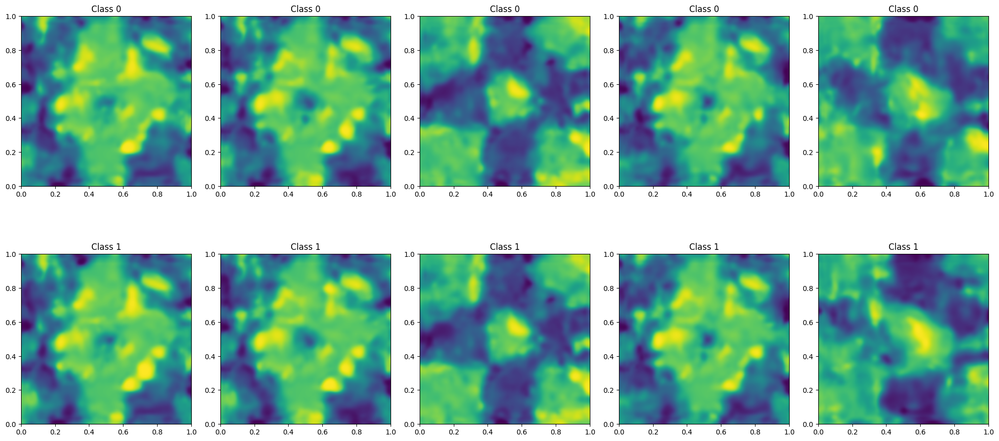

D_Loss: 0.006955421529710293,G_Loss: 0.9998162984848022 :  10%|█         | 200/2000 [01:18<10:46,  2.79it/s]  

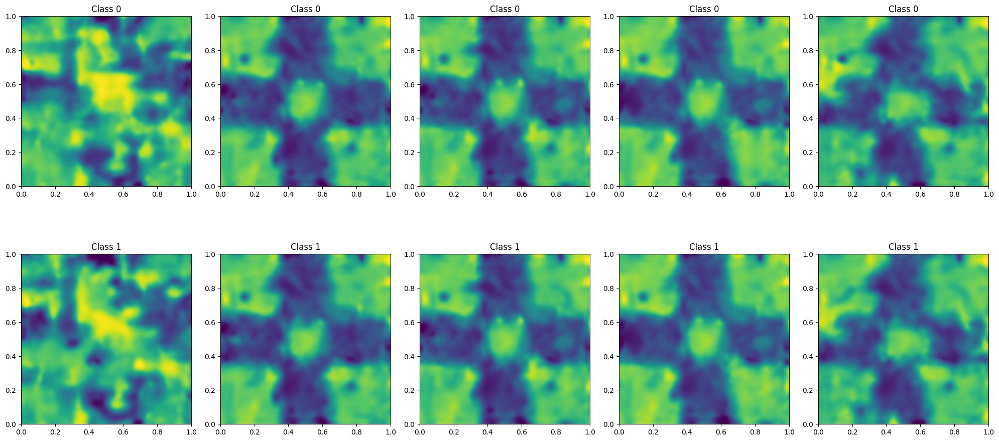

D_Loss: 0.18751344084739685,G_Loss: 1.0 :  12%|█▎        | 250/2000 [01:37<10:39,  2.74it/s]                  

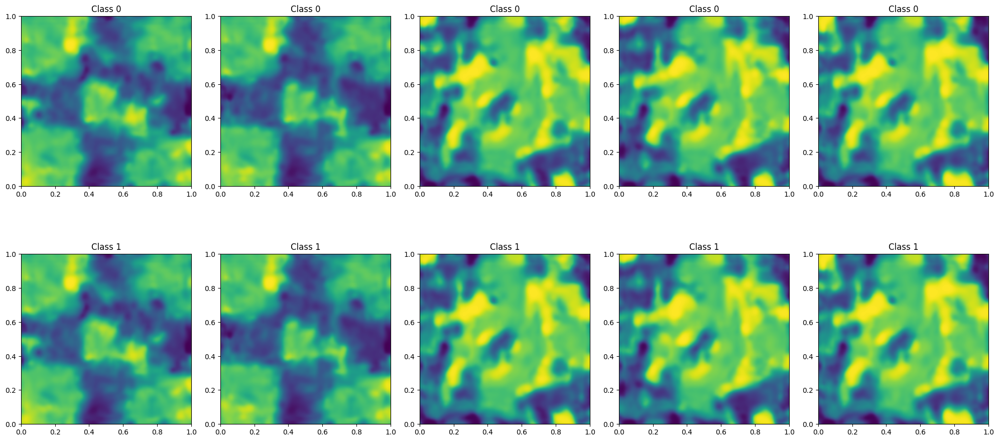

D_Loss: 0.25025317072868347,G_Loss: 1.0 :  15%|█▌        | 300/2000 [01:57<09:53,  2.86it/s]               

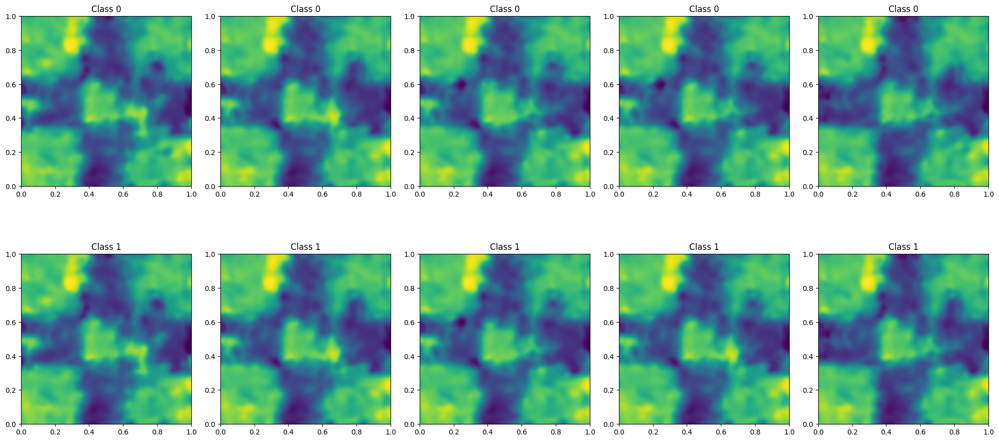

D_Loss: 0.31048429012298584,G_Loss: 1.0 :  18%|█▊        | 350/2000 [02:16<10:08,  2.71it/s]               

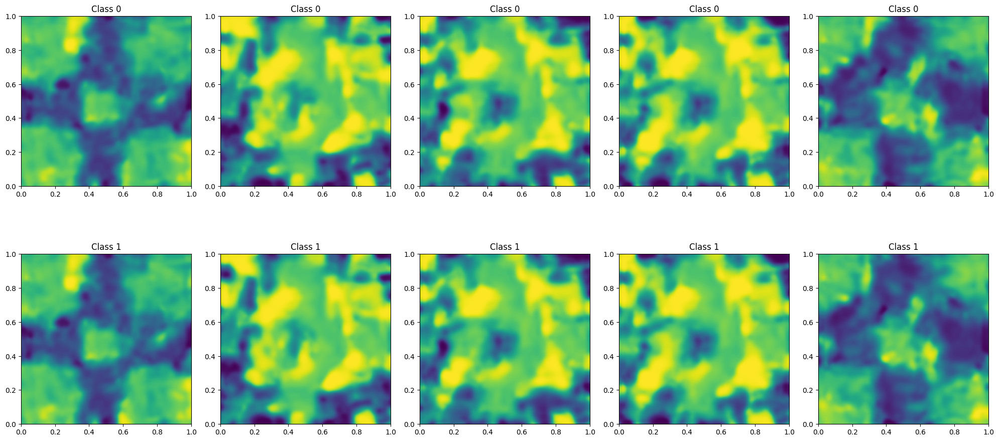

D_Loss: 0.18821029365062714,G_Loss: 0.9839547872543335 :  18%|█▊        | 359/2000 [02:21<10:44,  2.55it/s]


KeyboardInterrupt: 

In [97]:
# ----------
#  Training
# ----------
generator.train()
discriminator.train()
d_losses = []
g_losses = []
progress_bar =  tqdm(range(epochs), desc="Epochs")
for epoch in progress_bar:
    mean_d_losses = []
    mean_g_losses = []
    for batch_idx, (images, labels) in enumerate(train_loader):
        batch_size = images.size(0)

        # Adversarial ground truths
        valid = torch.ones((batch_size, 1), requires_grad=False).to(device)
        fake = torch.zeros((batch_size, 1), requires_grad=False).to(device)

        # Configure input
        real_images = images.type(torch.FloatTensor).to(device)
        labels = labels.type(torch.LongTensor).to(device)

        # -----------------
        #  Train Generator
        # -----------------

        optimizer_G.zero_grad()

        # Sample noise and labels as generator input
        noise = torch.FloatTensor(np.random.normal(0, 1, (batch_size, latent_dim))).to(device)
        # gen_labels = torch.LongTensor([[0, 1] if np.random.choice([True, False]) else [1, 0] for _ in range(batch_size)]).to(device)
        random_integers = np.random.randint(num_classes, size=batch_size)
        one_hot_labels = np.eye(num_classes)[random_integers]
        gen_labels = torch.LongTensor(one_hot_labels).to(device)

        # Generate a batch of sequences
        gen_seqs = generator(noise, gen_labels)
        
        # Loss measures generator's ability to fool the discriminator
        validity = discriminator(gen_seqs, gen_labels)
        g_loss = adversarial_loss(validity, valid)

        # Append loss to list
        mean_g_losses.append(g_loss.item())

        g_loss.backward()                    
        optimizer_G.step()

        # if epoch%2 == 0:
        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Loss for real images
        validity_real = discriminator(real_images, labels)
        d_real_loss = adversarial_loss(validity_real, valid)

        # Loss for fake images
        validity_fake = discriminator(gen_seqs.detach(), gen_labels)
        d_fake_loss = adversarial_loss(validity_fake, fake)

        # Total discriminator loss
        d_loss = (d_real_loss + d_fake_loss) / 2

        # Append current loss values to lists
        mean_d_losses.append(d_loss.item())

        d_loss.backward()
        optimizer_D.step()

        progress_bar.set_description(f'D_Loss: {d_loss.item()},G_Loss: {g_loss.item()} ')

    ## Print results every N epochs
    if epoch%50 == 0:
      generator.eval()
      with torch.no_grad():
        
        n_gen = 5  # Set the value of n_gen to a positive integer greater than 0
        noise_sample = torch.FloatTensor(np.random.normal(0, 1, (n_gen, latent_dim))).to(device)
        #Generate
        integers = np.arange(0,num_classes)
        one_hot_labels = np.eye(num_classes)[integers]
        #create plot axs
        fig, axs = plt.subplots(num_classes, n_gen, figsize=(20, 5*num_classes))

        for i in range(num_classes):
          generated_images = generator(noise_sample, torch.LongTensor([one_hot_labels[i]] * n_gen).to(device))
          generated_images_np = generated_images.cpu().detach().numpy().reshape((n_gen,img_size,img_size))

          for k in range(n_gen):
            axs[i,k].imshow(generated_images_np[k], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])
            axs[i,k].set_title(f"Class {i}")

        # Adjust layout
        plt.tight_layout()
        plt.show()

      generator.train()

    d_losses.append(np.mean(mean_d_losses))
    g_losses.append(np.mean(mean_g_losses))


# Generate using GAN

In [29]:
generator.eval()
with torch.no_grad():
    generated_images_all = []
    labels = []
    n_gen = 100  # number of generations per classes
    noise_sample = torch.FloatTensor(np.random.normal(0, 1, (n_gen, latent_dim))).to(device)
    #Generate
    integers = np.arange(0,num_classes)
    one_hot_labels = np.eye(num_classes)[integers]
    for i in range(num_classes):
        generated_images = generator(noise_sample, torch.LongTensor([one_hot_labels[i]] * n_gen).to(device))
        generated_images_np = generated_images.cpu().detach().numpy().reshape((n_gen,img_size,img_size))
        
        generated_images_all.append(generated_images_np)
        labels.append([one_hot_labels[i]] * n_gen)
    
    generated_images_all = np.array(generated_images_all)
    labels = np.array(labels)
    generated_images_all = generated_images_all.reshape(-1,1,img_size,img_size)
    labels = labels.reshape(-1,num_classes)

    #Save generated images
    np.save('VQVAE_MLPGAN_gunpoint.npy', generated_images_all)
    np.save('labels.npy', labels)

# Brouillon : essaie de génération d'indice du codebook mais ne fonctionne pas car le gradient ne se propage pas à travers les clamp

In [ ]:
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc, num_classes, embed_size, VQmodel, decoder_model):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.Upsample(scale_factor=5),
            nn.Conv2d(nz+embed_size*num_classes, ngf * 8, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 5 x 5``
            nn.Upsample(scale_factor=2),  # Upsample instead of ConvTranspose2d
            nn.Conv2d(ngf * 8, ngf * 4, 4, 1, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 9 x 9``
            nn.Upsample(scale_factor=2),  # Upsample instead of ConvTranspose2d
            nn.Conv2d(ngf * 4, nc, 3, 1, 1, bias=False),
            nn.Tanh(),
            # state size. ``(nc) x 18 x 18``
            nn.Flatten(),
        )

        self.embed = nn.Embedding(num_classes, embed_size)

        self.codebook = VQmodel.embedding.weight.detach()
        self.VQnum_embeddings = codebook.shape[0]
        self.VQembedding_dim = codebook.shape[1]
        self.post_quant_layer = VQmodel.post_quant_conv

        self.decoder = decoder_model

        # Set requires_grad to False for layers that don't require gradient computation
        for param in self.post_quant_layer.parameters():
            param.requires_grad = False
        for param in self.decoder.parameters():
            param.requires_grad = False

    def forward(self, input, labels):
        embedding = self.embed(labels)
        embedding = embedding.view(len(embedding), -1).unsqueeze(2).unsqueeze(3)
        input = input.unsqueeze(2).unsqueeze(3)
        x = torch.cat([input, embedding], dim=1)
        out = self.main(x)
        out = (out + 1) * 0.5 * (self.VQnum_embeddings - 1)
        out = torch.round(out)  # Round to the nearest integer
        out_indices = torch.clamp(out, 0, self.VQnum_embeddings - 1)  # Clamp to ensure within range

        out_quant = out_indices + (self.codebook[out_indices.long()] - out_indices).detach()
        
        out_quant=out_quant.reshape((-1, 18, 18, self.VQembedding_dim)).permute(0, 3, 1, 2)
        out_embed = self.post_quant_layer(out_quant)
        
        out_img = self.decoder(out_embed)
            
        return out_img

class Discriminator(nn.Module):
    def __init__(self, nc, ndf, num_classes, img_size):
        super(Discriminator, self).__init__()
        self.img_size = img_size
        self.num_classes = num_classes
        self.main = nn.Sequential(
            # input is ``(nc) x 150 x 150``
            nn.Conv2d(nc+num_classes, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 75 x 75``
            nn.Conv2d(ndf, ndf * 2, 3, 2, 2, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 38 x 38``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 19 x 19``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 9 x 9``
            nn.Conv2d(ndf * 8, 1, 4, 2, 0, bias=False),
            # state size. ``1 x 3 x 3``
            nn.Conv2d(1, 1, 3, 1, 0, bias=False),
            nn.Sigmoid()
        )

        self.embed = nn.Embedding(num_classes, img_size*img_size)

    def forward(self, input, labels):
        embedding = self.embed(labels).view(labels.shape[0],self.num_classes,self.img_size,self.img_size)
        x = torch.cat([input, embedding], dim=1)
        return self.main(x)


In [ ]:
# ----------
#  Training
# ----------
generator.train()
discriminator.train()
d_losses = []
g_losses = []
progress_bar =  tqdm(range(epochs), desc="Epochs")
for epoch in progress_bar:
    mean_d_losses = []
    mean_g_losses = []
    for batch_idx, (images, labels) in enumerate(train_loader):
        batch_size = images.size(0)

        # Adversarial ground truths
        valid = torch.ones((batch_size, 1), requires_grad=False).to(device)
        fake = torch.zeros((batch_size, 1), requires_grad=False).to(device)

        # Configure input
        real_images = images.type(torch.FloatTensor).to(device)
        labels = labels.type(torch.LongTensor).to(device)

        # -----------------
        #  Train Generator
        # -----------------

        optimizer_G.zero_grad()

        # Sample noise and labels as generator input
        noise = torch.FloatTensor(np.random.normal(0, 1, (batch_size, latent_dim))).to(device)
        # gen_labels = torch.LongTensor([[0, 1] if np.random.choice([True, False]) else [1, 0] for _ in range(batch_size)]).to(device)
        random_integers = np.random.randint(num_classes, size=batch_size)
        one_hot_labels = np.eye(num_classes)[random_integers]
        gen_labels = torch.LongTensor(one_hot_labels).to(device)

        # Generate a batch of sequences
        gen_quant = generator(noise, gen_labels)
        gen_quant=gen_quant.reshape((-1, 18, 18, embedding_dim)).permute(0, 3, 1, 2)
        gen_embed = vector_quantization.post_quant_conv(gen_quant)
        
        gen_seqs = decoder(gen_embed)

        # Loss measures generator's ability to fool the discriminator
        validity = discriminator(gen_seqs, gen_labels)
        g_loss = adversarial_loss(validity, valid)

        # Append loss to list
        mean_g_losses.append(g_loss.item())

        g_loss.backward()

        # Print gradients of out_indices
        if hasattr(generator, 'main'):
            for param in generator.main.parameters():
                    print(param.grad)
                    
        optimizer_G.step()

        # if epoch%2 == 0:
        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Loss for real images
        validity_real = discriminator(real_images, labels)
        d_real_loss = adversarial_loss(validity_real, valid)

        # Loss for fake images
        validity_fake = discriminator(gen_seqs.detach(), gen_labels)
        d_fake_loss = adversarial_loss(validity_fake, fake)

        # Total discriminator loss
        d_loss = (d_real_loss + d_fake_loss) / 2

        # Append current loss values to lists
        mean_d_losses.append(d_loss.item())

        d_loss.backward()
        optimizer_D.step()

        progress_bar.set_description(f'D_Loss: {d_loss.item()},G_Loss: {g_loss.item()} ')

    ## Print results every N epochs
    if epoch%20 == 0:
      generator.eval()
      with torch.no_grad():
        
        n_gen = 5  # Set the value of n_gen to a positive integer greater than 0
        noise_sample = torch.FloatTensor(np.random.normal(0, 1, (n_gen, latent_dim))).to(device)
        #Generate
        integers = np.arange(0,num_classes)
        one_hot_labels = np.eye(num_classes)[integers]
        #create plot axs
        fig, axs = plt.subplots(num_classes, n_gen, figsize=(20, 5*num_classes))

        for i in range(num_classes):
          generated_images = generator(noise_sample, torch.LongTensor([one_hot_labels[i]] * n_gen).to(device))
          generated_images_np = generated_images.cpu().detach().numpy().reshape((n_gen,img_size,img_size))

          for k in range(n_gen):
            axs[i,k].imshow(generated_images_np[k], cmap='viridis', origin='lower', extent=[0, 1, 0, 1])
            axs[i,k].set_title(f"Class {i}")

        # Adjust layout
        plt.tight_layout()
        plt.show()

      generator.train()

    d_losses.append(np.mean(mean_d_losses))
    g_losses.append(np.mean(mean_g_losses))
